In [1]:
import os
import glob
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import timm

/home/4284/.conda/envs/rse/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from PIL import Image

def remove_lower_panel(img, panel_height=62):
    """
    Remove the lower annotation/panel region from a TIFF image.

    Parameters
    ----------
    img : PIL.Image
        Input image.
    panel_height : int
        Number of pixels to remove from the bottom.

    Returns
    -------
    PIL.Image
        Cropped image without the lower panel.
    """

    # PIL gives size as (width, height)
    w, h = img.size

    # Safety check: only crop if image is tall enough
    if h > panel_height:
        img = img.crop((0, 0, w, h - panel_height))

    return img

In [3]:
def center_crop_square(img):
    """
    Center crop a PIL image into a square.

    This keeps the central region of the microstructure
    and removes extra width/height if the image is rectangular.
    """

    w, h = img.size

    # Use the smaller dimension to make a square crop
    crop_size = min(w, h)

    left = (w - crop_size) // 2
    top = (h - crop_size) // 2
    right = left + crop_size
    bottom = top + crop_size

    img = img.crop((left, top, right, bottom))

    return img

In [4]:
import os
import glob
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms


class TiffDataset(Dataset):
    def __init__(self, folder, image_size=224, panel_height=62):
        self.folder = folder
        self.image_size = image_size
        self.panel_height = panel_height

        self.files = sorted(
            glob.glob(os.path.join(folder, "*.tif")) +
            glob.glob(os.path.join(folder, "*.tiff"))
        )

        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.Grayscale(num_output_channels=3),
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        # Load TIFF image
        img = Image.open(self.files[idx]).convert("L")

        # Step 1: remove lower 62-pixel panel
        img = remove_lower_panel(img, panel_height=self.panel_height)

        # Step 2: center crop useful microstructure region
        img = center_crop_square(img)

        # Step 3: resize + convert to 3-channel tensor
        img_tensor = self.transform(img)

        return img_tensor

In [5]:
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

DATA_DIR = "/lustre/darse/users/4284/rse_resourses/1400"
BATCH_SIZE = 8

dataset = TiffDataset(DATA_DIR, image_size=224, panel_height=62)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

batch = next(iter(loader))

print("Batch shape:", batch.shape)

Batch shape: torch.Size([8, 3, 224, 224])


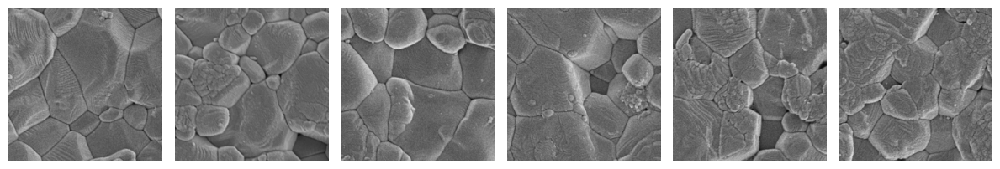

In [6]:
plt.figure(figsize=(12, 4))

for i in range(min(6, batch.size(0))):
    img = batch[i].permute(1, 2, 0).numpy()

    plt.subplot(1, 6, i + 1)
    plt.imshow(img, cmap="gray")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [7]:
#!pip install scikit-image --only-binary=:all:

In [8]:
import numpy as np
from skimage.filters import threshold_otsu

In [9]:
def create_pseudo_mask(img_tensor):
    """
    Convert an image tensor into a binary mask using Otsu thresholding.

    Input:
        img_tensor: [3, H, W] (from your dataset)

    Output:
        mask: [1, H, W] (binary mask)
    """

    # Convert tensor to numpy (H, W)
    img = img_tensor[0].numpy()  # take one channel

    # Compute threshold
    thresh = threshold_otsu(img)

    # Create binary mask
    mask = (img < thresh).astype(np.float32)

    return mask

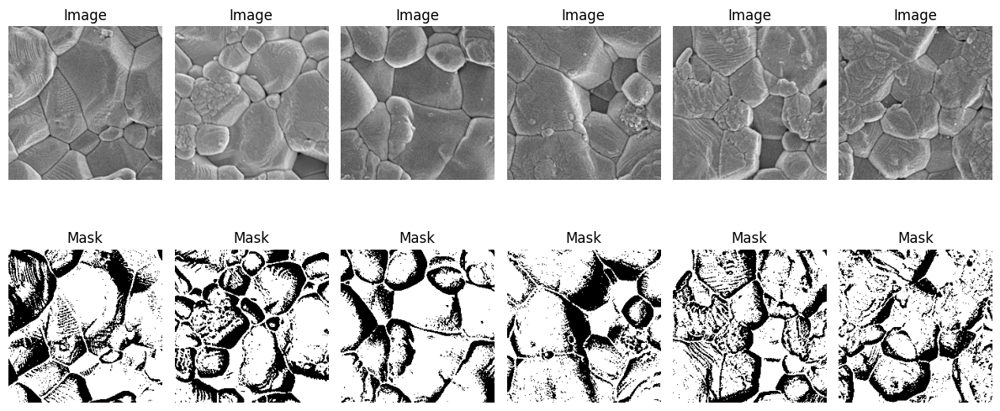

In [10]:
plt.figure(figsize=(12, 6))

for i in range(min(6, batch.size(0))):
    img = batch[i]
    mask = create_pseudo_mask(img)

    # Original
    plt.subplot(2, 6, i + 1)
    plt.imshow(img[0], cmap="gray")
    plt.title("Image")
    plt.axis("off")

    # Mask
    plt.subplot(2, 6, i + 7)
    plt.imshow(mask, cmap="gray")
    plt.title("Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [11]:
#mask smoothing
import numpy as np
import matplotlib.pyplot as plt

from skimage.filters import threshold_otsu, gaussian
from skimage.morphology import remove_small_objects, remove_small_holes, binary_closing, disk

In [12]:
def create_clean_pseudo_mask(
    img_tensor,
    sigma=1.0,
    min_object_size=40,
    min_hole_size=40,
    closing_radius=1
):
    """
    Create a cleaner binary pseudo-mask from a microstructure image.

    Parameters
    ----------
    img_tensor : torch.Tensor
        Image tensor with shape [3, H, W].
        Since all 3 channels are repeated grayscale, we use only channel 0.

    sigma : float
        Controls Gaussian smoothing.
        Higher value removes more texture noise, but may blur small pores.
        #lower sigma: keeps fine details, but noisier
        #higher sigma: smoother masks, but may lose small pores (we will change different values: 0.5, 1.0, 1.5, 2.0)

    min_object_size : int
        Removes connected white mask regions smaller than this many pixels.
        (remove tiny white dots)

    min_hole_size : int
        Fills black holes inside white regions smaller than this many pixels.
        (Fills tiny black holes inside white segmented regions.)

    closing_radius : int
        Radius of disk-shaped structuring element for binary closing.

    Returns
    -------
    mask : np.ndarray
        Binary mask with shape [H, W], values 0 or 1.
    """

    # 1. Convert tensor to numpy grayscale image
    # img_tensor shape: [3, H, W]
    img = img_tensor[0].detach().cpu().numpy()

    # 2. Smooth the image before thresholding
    # This reduces tiny texture variations that cause noisy masks.
    img_smooth = gaussian(img, sigma=sigma)

    # 3. Compute Otsu threshold automatically
    thresh = threshold_otsu(img_smooth)

    # 4. Create binary mask
    # Dark regions have lower intensity, so we use img_smooth < thresh.
    mask = img_smooth < thresh

    # 5. Remove very small isolated white regions
    mask = remove_small_objects(mask, min_size=min_object_size)

    # 6. Fill very small holes inside segmented regions
    mask = remove_small_holes(mask, area_threshold=min_hole_size)

    # 7. Smooth fragmented boundaries slightly
    if closing_radius > 0:
        mask = binary_closing(mask, disk(closing_radius))

    # 8. Convert boolean mask to float32: 0.0 or 1.0
    mask = mask.astype(np.float32)

    return mask

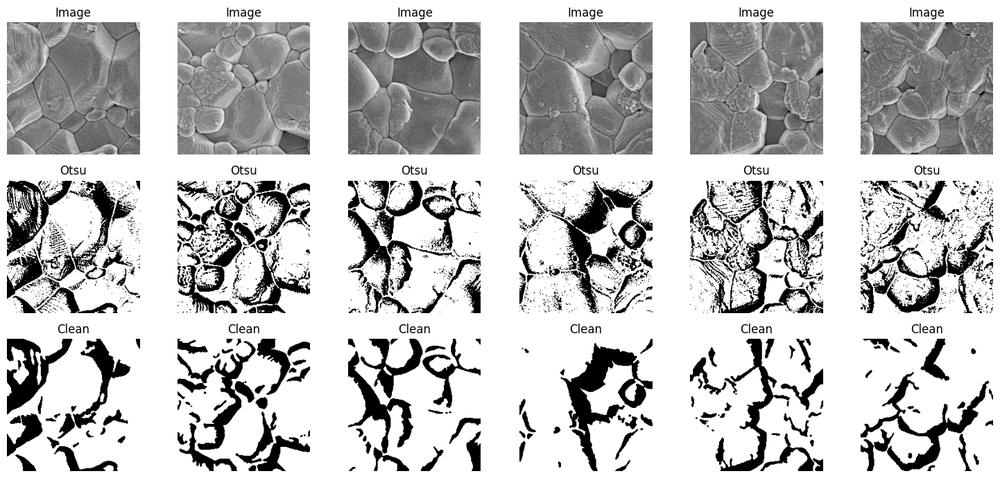

In [13]:
plt.figure(figsize=(15, 7))

for i in range(min(6, batch.size(0))):
    img = batch[i]

    noisy_mask = create_pseudo_mask(img)
    clean_mask = create_clean_pseudo_mask(
        img,
        sigma=1.5,
        min_object_size=40,
        min_hole_size=40,
        closing_radius=1
    )

    # Original image
    plt.subplot(3, 6, i + 1)
    plt.imshow(img[0].detach().cpu().numpy(), cmap="gray")
    plt.title("Image")
    plt.axis("off")

    # Basic Otsu mask
    plt.subplot(3, 6, i + 7)
    plt.imshow(noisy_mask, cmap="gray")
    plt.title("Otsu")
    plt.axis("off")

    # Cleaned mask
    plt.subplot(3, 6, i + 13)
    plt.imshow(clean_mask, cmap="gray")
    plt.title("Clean")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [14]:
def show_mask_overlay(img_tensor, mask, alpha=0.45):
    """
    Show original image with binary mask overlay.
    
    img_tensor: [3, H, W]
    mask: [H, W]
    """

    img = img_tensor[0].detach().cpu().numpy()

    plt.figure(figsize=(5, 5))

    # show grayscale image first
    plt.imshow(img, cmap="gray")

    # overlay only mask pixels
    masked = np.ma.masked_where(mask == 0, mask)
    plt.imshow(masked, cmap="autumn", alpha=alpha)

    plt.title("Mask Overlay")
    plt.axis("off")
    plt.show()

Image shape: torch.Size([3, 224, 224])
Mask shape: (224, 224)
Mask unique values: [0. 1.]


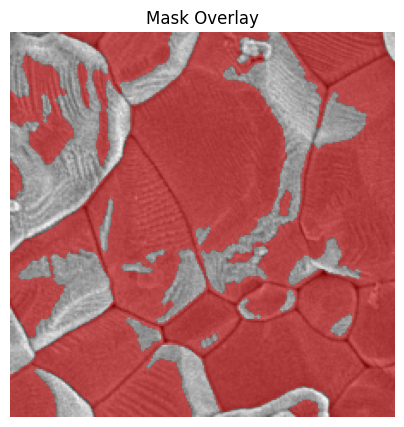

In [15]:
img = batch[0]

mask = create_clean_pseudo_mask(
    img,
    sigma=1.5,
    min_object_size=40,
    min_hole_size=40,
    closing_radius=1
)

print("Image shape:", img.shape)
print("Mask shape:", mask.shape)
print("Mask unique values:", np.unique(mask))

show_mask_overlay(img, mask, alpha=0.45)

In [16]:
#pore-like region segmentation
class SegmentationTiffDataset(Dataset):
    def __init__(
        self,
        folder,
        image_size=224,
        panel_height=62,
        sigma=1.5,
        min_object_size=40,
        min_hole_size=40,
        closing_radius=1
    ):
        self.folder = folder
        self.image_size = image_size
        self.panel_height = panel_height

        self.sigma = sigma
        self.min_object_size = min_object_size
        self.min_hole_size = min_hole_size
        self.closing_radius = closing_radius

        self.files = sorted(
            glob.glob(os.path.join(folder, "**", "*.tif"), recursive=True) +
            glob.glob(os.path.join(folder, "**", "*.tiff"), recursive=True) +
            glob.glob(os.path.join(folder, "**", "*.TIF"), recursive=True) +
            glob.glob(os.path.join(folder, "**", "*.TIFF"), recursive=True)
        )

        print(f"Found {len(self.files)} TIFF images")

        self.transform_img = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.Grayscale(num_output_channels=3),
            transforms.ToTensor(),
        ])

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        img = Image.open(self.files[idx]).convert("L")

        img = remove_lower_panel(img, panel_height=self.panel_height)
        img = center_crop_square(img)

        image = self.transform_img(img)

        mask_np = create_clean_pseudo_mask(
            image,
            sigma=self.sigma,
            min_object_size=self.min_object_size,
            min_hole_size=self.min_hole_size,
            closing_radius=self.closing_radius
        )

        mask = torch.from_numpy(mask_np).unsqueeze(0).float()

        return image, mask

In [17]:
#PATH='/lustre/darse/users/4284/rse_resourses/processed_data'
seg_dataset = SegmentationTiffDataset(DATA_DIR)
seg_loader = DataLoader(seg_dataset, batch_size=8, shuffle=True)

images, masks = next(iter(seg_loader))

print("Images:", images.shape)
print("Masks:", masks.shape)

Found 206 TIFF images
Images: torch.Size([8, 3, 224, 224])
Masks: torch.Size([8, 1, 224, 224])


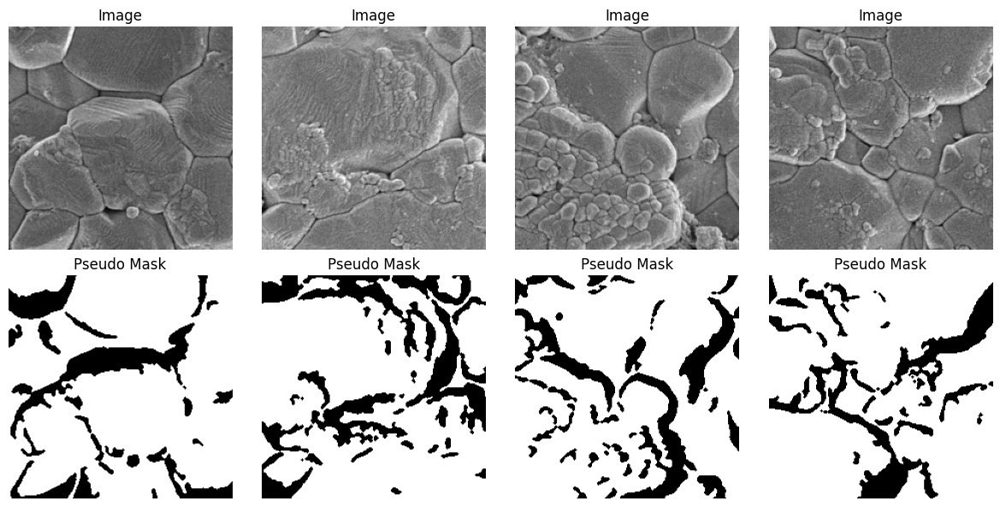

In [18]:
plt.figure(figsize=(12, 6))

for i in range(4):
    img = images[i][0].numpy()
    mask = masks[i][0].numpy()

    plt.subplot(2, 4, i + 1)
    plt.imshow(img, cmap="gray")
    plt.title("Image")
    plt.axis("off")

    plt.subplot(2, 4, i + 5)
    plt.imshow(mask, cmap="gray")
    plt.title("Pseudo Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [19]:
#simple CNN model as baseline
import torch
import torch.nn as nn

class SimpleSegNet(nn.Module):
    def __init__(self):
        super().__init__()

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),   # 224 → 112

            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),   # 112 → 56

            nn.Conv2d(64, 128, 3, padding=1),
            nn.ReLU(),
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 2, stride=2),  # 56 → 112
            nn.ReLU(),

            nn.ConvTranspose2d(64, 32, 2, stride=2),   # 112 → 224
            nn.ReLU(),

            nn.Conv2d(32, 1, 1)  # final mask
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [20]:
criterion = nn.BCEWithLogitsLoss()
device = "cuda" if torch.cuda.is_available() else "cpu"

model = SimpleSegNet().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

In [21]:
images, masks = next(iter(seg_loader))

images = images.to(device)
masks = masks.to(device)

preds = model(images)

loss = criterion(preds, masks)

print("Loss:", loss.item())

Loss: 0.674525797367096


In [22]:
def visualize_predictions(model, loader, device, num_samples=4):
    model.eval()

    images, masks = next(iter(loader))

    images = images.to(device)
    masks = masks.to(device)

    with torch.no_grad():
        preds = model(images)
        preds = torch.sigmoid(preds)  # convert logits → probabilities
        preds = (preds > 0.5).float()  # threshold → binary

    images = images.cpu()
    masks = masks.cpu()
    preds = preds.cpu()

    plt.figure(figsize=(12, 6))

    for i in range(num_samples):
        # Original Image
        plt.subplot(3, num_samples, i + 1)
        plt.imshow(images[i][0], cmap="gray")
        plt.title("Image")
        plt.axis("off")

        # Ground Truth (Pseudo Mask)
        plt.subplot(3, num_samples, i + 1 + num_samples)
        plt.imshow(masks[i][0], cmap="gray")
        plt.title("GT Mask")
        plt.axis("off")

        # Predicted Mask
        plt.subplot(3, num_samples, i + 1 + 2*num_samples)
        plt.imshow(preds[i][0], cmap="gray")
        plt.title("Pred")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Epoch 0: Loss = 0.6623
Saved best model


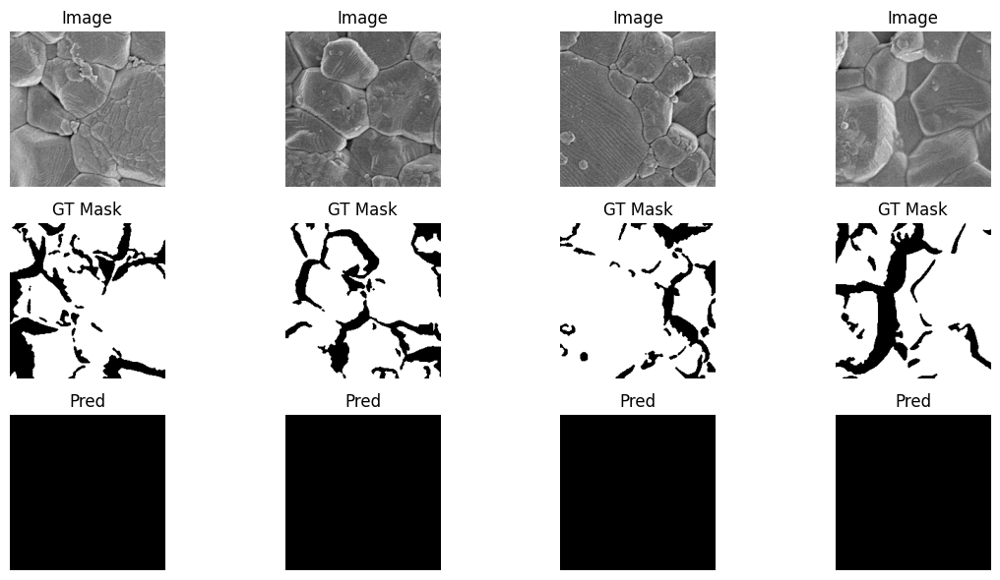

Epoch 1: Loss = 0.6548
Saved best model
Epoch 2: Loss = 0.6288
Saved best model


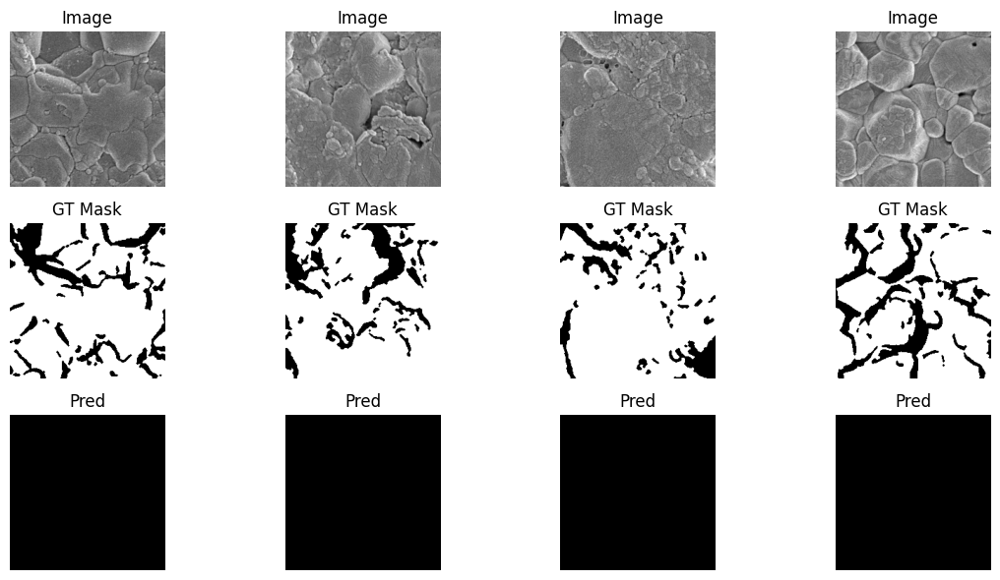

Epoch 3: Loss = 0.6017
Saved best model
Epoch 4: Loss = 0.5941
Saved best model


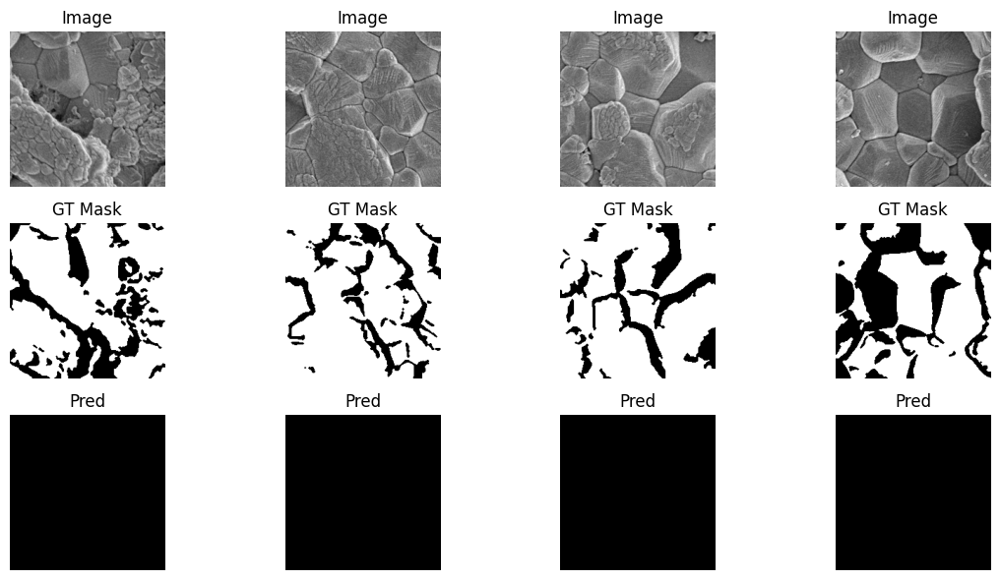

Epoch 5: Loss = 0.5879
Saved best model
Epoch 6: Loss = 0.5731
Saved best model


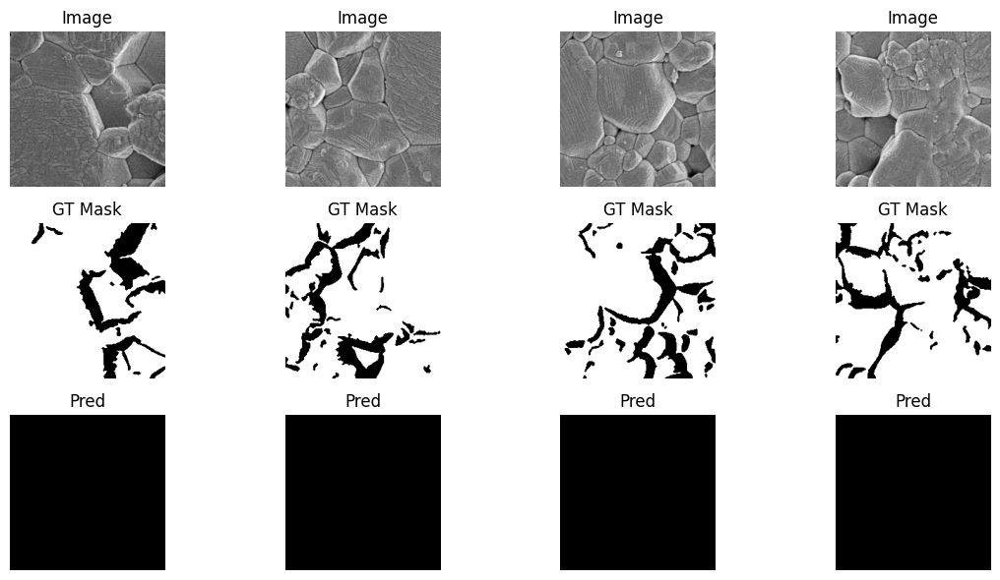

Epoch 7: Loss = 0.5492
Saved best model
Epoch 8: Loss = 0.4972
Saved best model


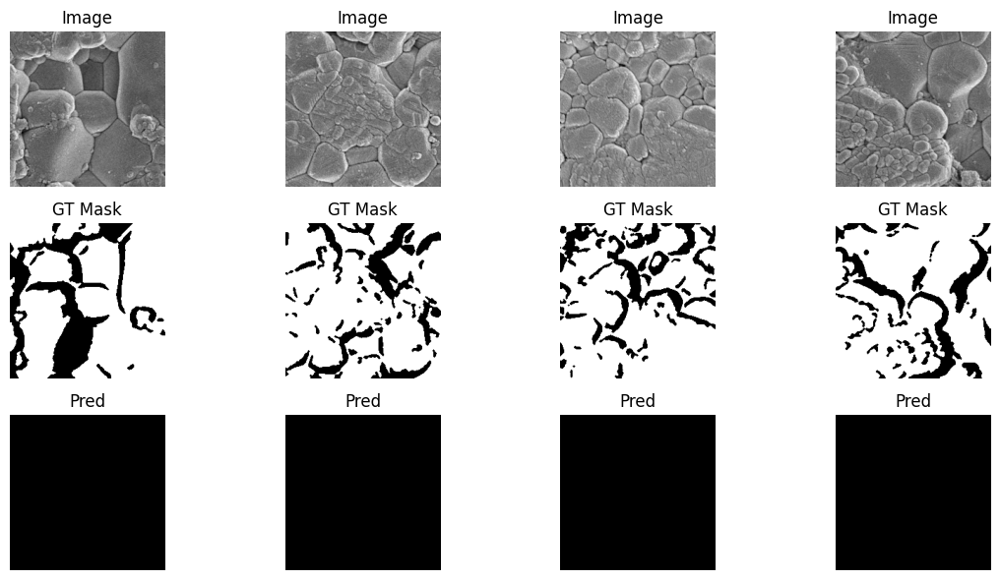

Epoch 9: Loss = 0.4296
Saved best model
Epoch 10: Loss = 0.3874
Saved best model


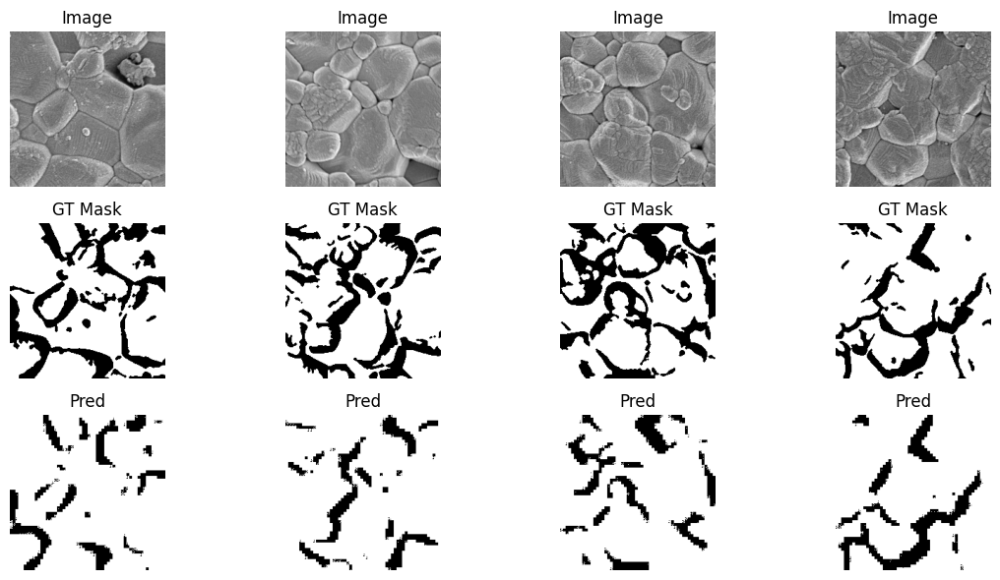

Epoch 11: Loss = 0.3426
Saved best model
Epoch 12: Loss = 0.3115
Saved best model


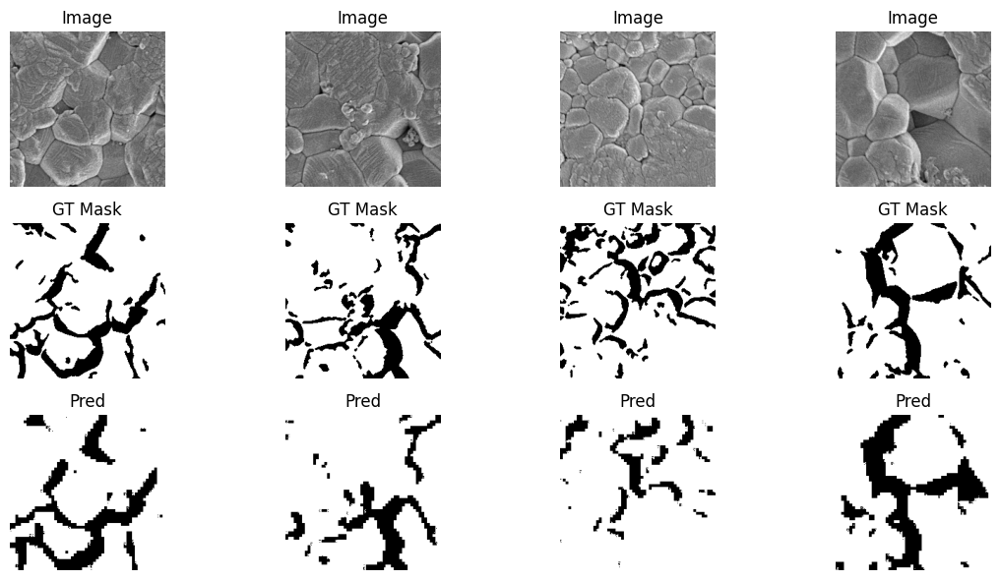

Epoch 13: Loss = 0.2891
Saved best model
Epoch 14: Loss = 0.2794
Saved best model


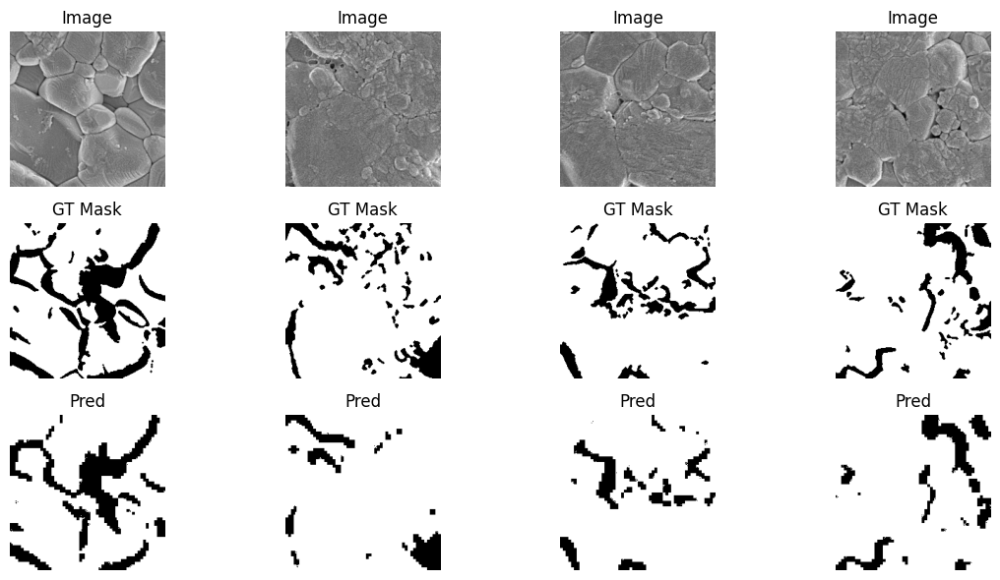

Epoch 15: Loss = 0.2896
Epoch 16: Loss = 0.2714
Saved best model


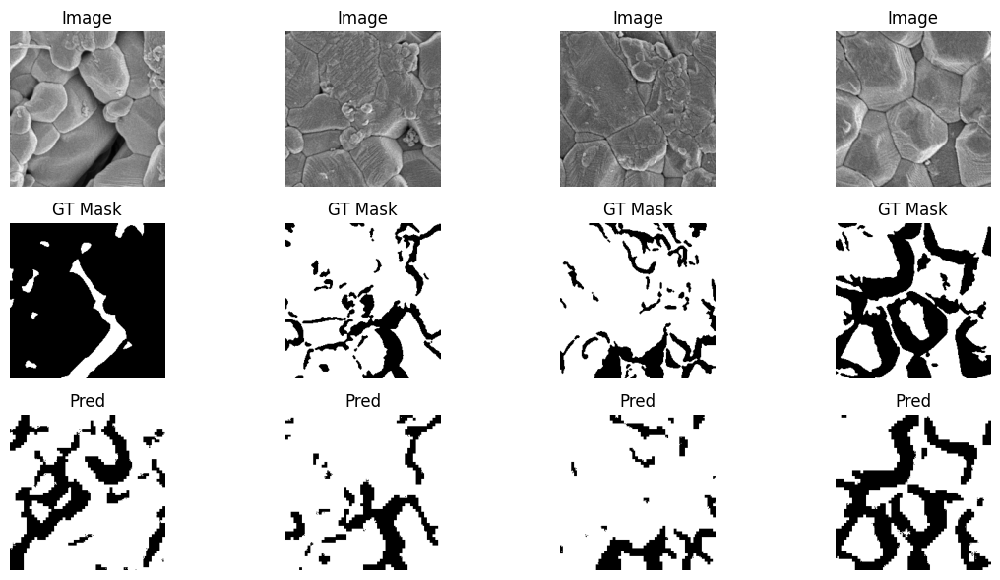

Epoch 17: Loss = 0.2721
Epoch 18: Loss = 0.2647
Saved best model


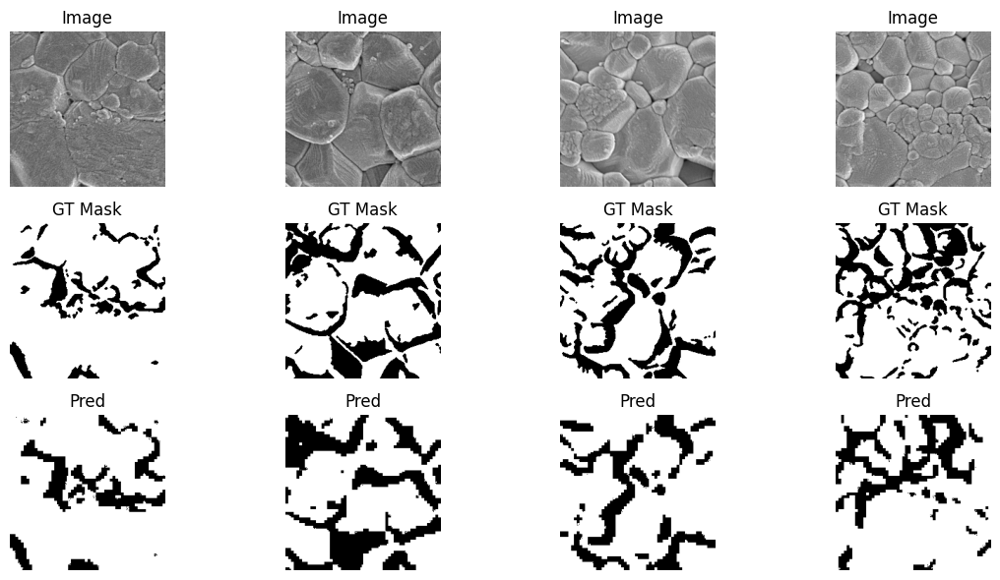

Epoch 19: Loss = 0.2698


In [23]:
'''for epoch in range(10):
    model.train()
    total_loss = 0

    for images, masks in seg_loader:
        images = images.to(device)
        masks = masks.to(device)

        preds = model(images)
        loss = criterion(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    print(f"Epoch {epoch}: Loss = {total_loss:.4f}")

    # Visualize every epoch
    visualize_predictions(model, seg_loader, device)
    '''
train_losses = []
best_loss = float("inf")

for epoch in range(20):
    model.train()
    total_loss = 0

    for images, masks in seg_loader:
        images = images.to(device)
        masks = masks.to(device)

        preds = model(images)
        loss = criterion(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(seg_loader)
    train_losses.append(avg_loss)   # for storing the training loss

    print(f"Epoch {epoch}: Loss = {avg_loss:.4f}")

    if avg_loss < best_loss:
        best_loss = avg_loss
        torch.save(model.state_dict(), "best_simple_segnet_1400_1.pth")
        print("Saved best model")

    if epoch % 2 == 0:
        visualize_predictions(model, seg_loader, device)

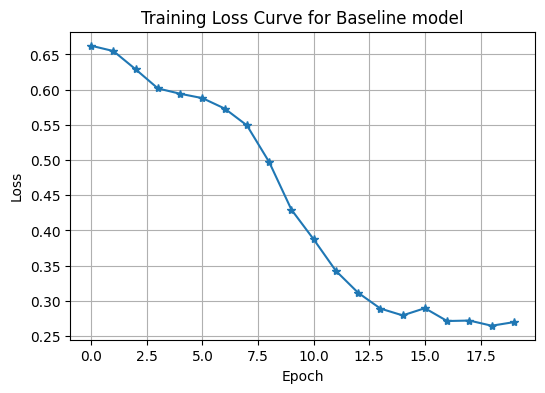

In [24]:
#plotting the loss curve
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
plt.plot(train_losses, marker='*')
#plt.scatter(best_epoch, min(train_losses), color='red', label='Best Epoch')
plt.title("Training Loss Curve for Baseline model")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
#plt.legend()
plt.show()

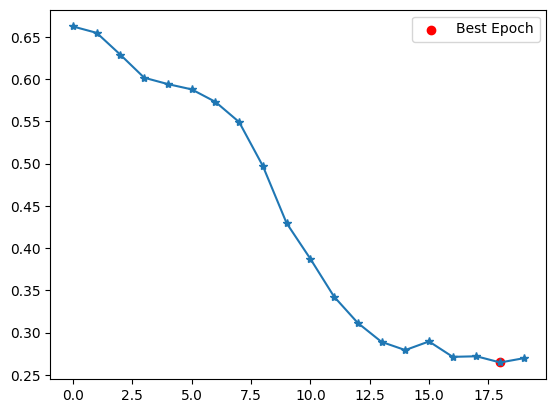

In [25]:
best_epoch = train_losses.index(min(train_losses))

plt.plot(train_losses, marker='*')
plt.scatter(best_epoch, min(train_losses), color='red', label='Best Epoch')
plt.legend()

In [26]:
#U-Net model
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),

            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)

In [27]:
class UNetSmall(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()

        # Encoder
        self.enc1 = DoubleConv(in_channels, 32)    # 224 x 224
        self.pool1 = nn.MaxPool2d(2)               # 112 x 112

        self.enc2 = DoubleConv(32, 64)             # 112 x 112
        self.pool2 = nn.MaxPool2d(2)               # 56 x 56

        self.enc3 = DoubleConv(64, 128)            # 56 x 56
        self.pool3 = nn.MaxPool2d(2)               # 28 x 28

        # Bottleneck
        self.bottleneck = DoubleConv(128, 256)     # 28 x 28

        # Decoder
        self.up3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)  # 56 x 56
        self.dec3 = DoubleConv(256, 128)

        self.up2 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)   # 112 x 112
        self.dec2 = DoubleConv(128, 64)

        self.up1 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)    # 224 x 224
        self.dec1 = DoubleConv(64, 32)

        # Final output layer
        self.final = nn.Conv2d(32, out_channels, kernel_size=1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)          # [B, 32, 224, 224]
        p1 = self.pool1(e1)        # [B, 32, 112, 112]

        e2 = self.enc2(p1)         # [B, 64, 112, 112]
        p2 = self.pool2(e2)        # [B, 64, 56, 56]

        e3 = self.enc3(p2)         # [B, 128, 56, 56]
        p3 = self.pool3(e3)        # [B, 128, 28, 28]

        # Bottleneck
        b = self.bottleneck(p3)    # [B, 256, 28, 28]

        # Decoder with skip connections
        u3 = self.up3(b)           # [B, 128, 56, 56]
        u3 = torch.cat([u3, e3], dim=1)
        d3 = self.dec3(u3)         # [B, 128, 56, 56]

        u2 = self.up2(d3)          # [B, 64, 112, 112]
        u2 = torch.cat([u2, e2], dim=1)
        d2 = self.dec2(u2)         # [B, 64, 112, 112]

        u1 = self.up1(d2)          # [B, 32, 224, 224]
        u1 = torch.cat([u1, e1], dim=1)
        d1 = self.dec1(u1)         # [B, 32, 224, 224]

        out = self.final(d1)       # [B, 1, 224, 224]

        return out

In [28]:
device = "cuda" if torch.cuda.is_available() else "cpu"

unet_model = UNetSmall(in_channels=3, out_channels=1).to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(unet_model.parameters(), lr=1e-4)

Epoch 0: U-Net Loss = 0.5383
Saved best U-Net model


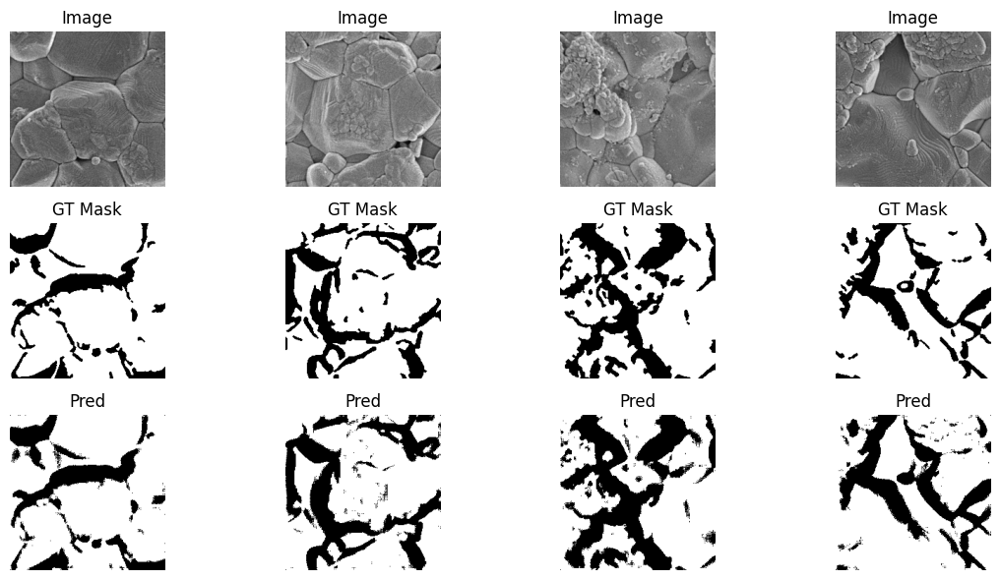

Epoch 1: U-Net Loss = 0.3856
Saved best U-Net model
Epoch 2: U-Net Loss = 0.3496
Saved best U-Net model


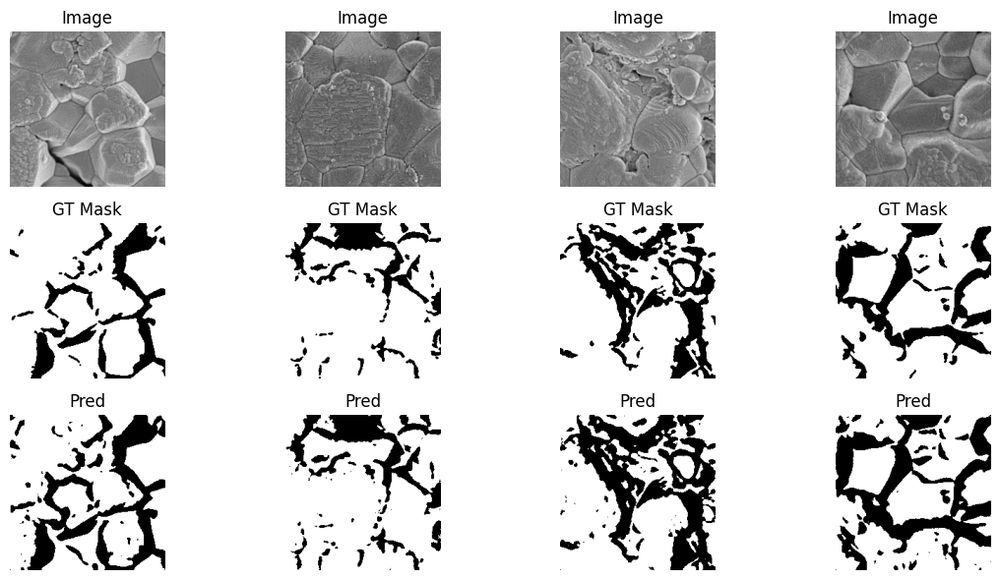

Epoch 3: U-Net Loss = 0.3327
Saved best U-Net model
Epoch 4: U-Net Loss = 0.3226
Saved best U-Net model


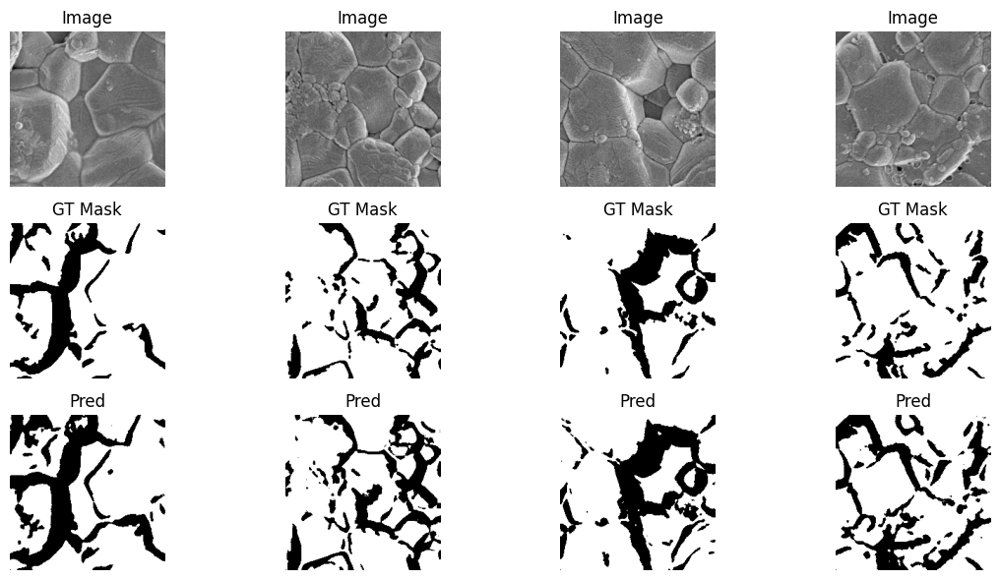

Epoch 5: U-Net Loss = 0.3105
Saved best U-Net model
Epoch 6: U-Net Loss = 0.3034
Saved best U-Net model


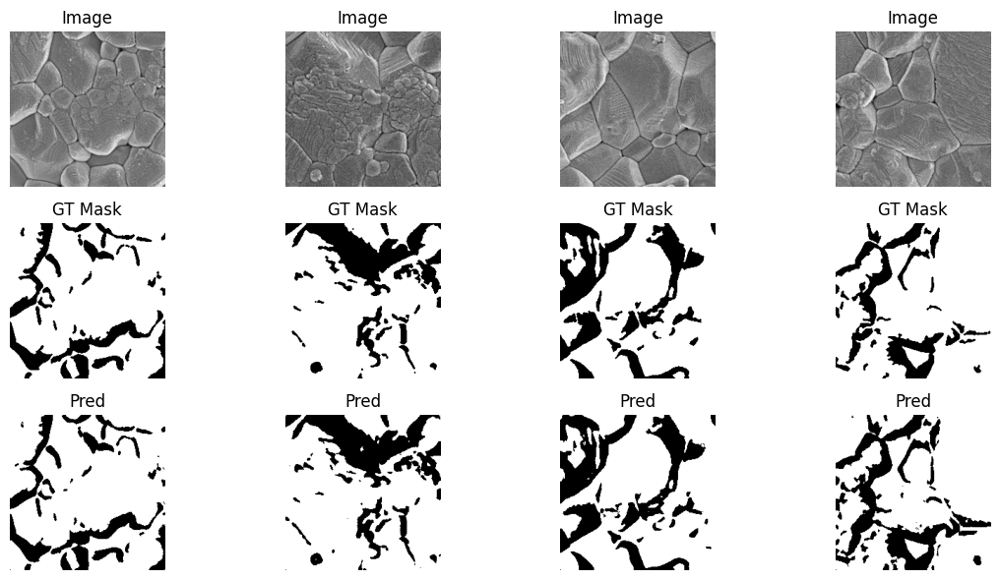

Epoch 7: U-Net Loss = 0.2932
Saved best U-Net model
Epoch 8: U-Net Loss = 0.2872
Saved best U-Net model


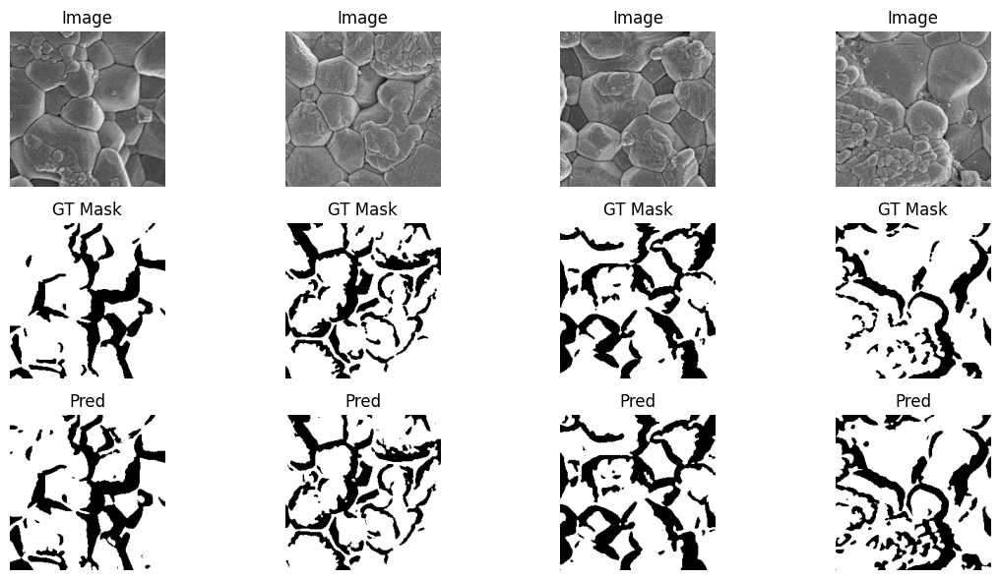

Epoch 9: U-Net Loss = 0.2759
Saved best U-Net model
Epoch 10: U-Net Loss = 0.2686
Saved best U-Net model


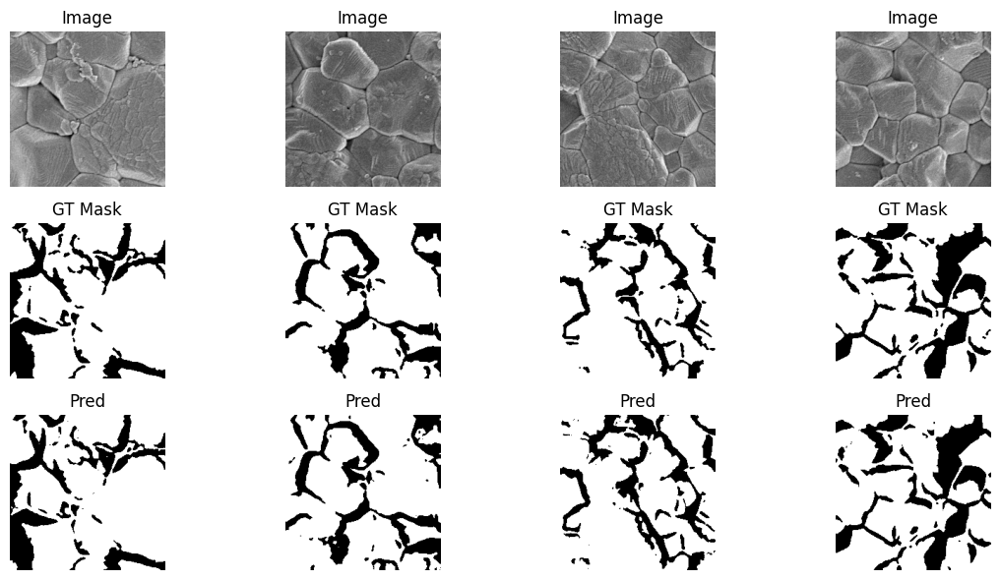

Epoch 11: U-Net Loss = 0.2633
Saved best U-Net model
Epoch 12: U-Net Loss = 0.2556
Saved best U-Net model


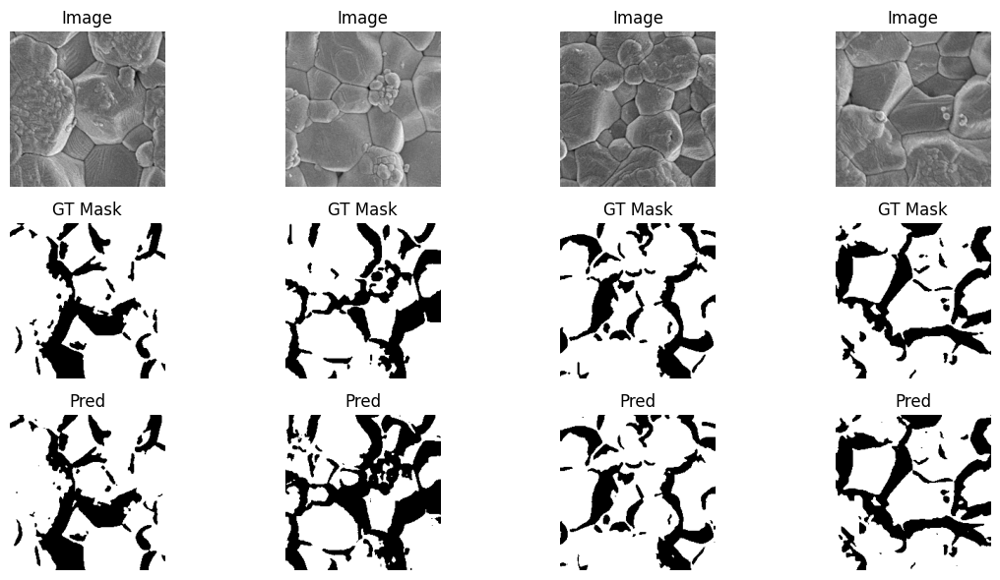

Epoch 13: U-Net Loss = 0.2485
Saved best U-Net model
Epoch 14: U-Net Loss = 0.2407
Saved best U-Net model


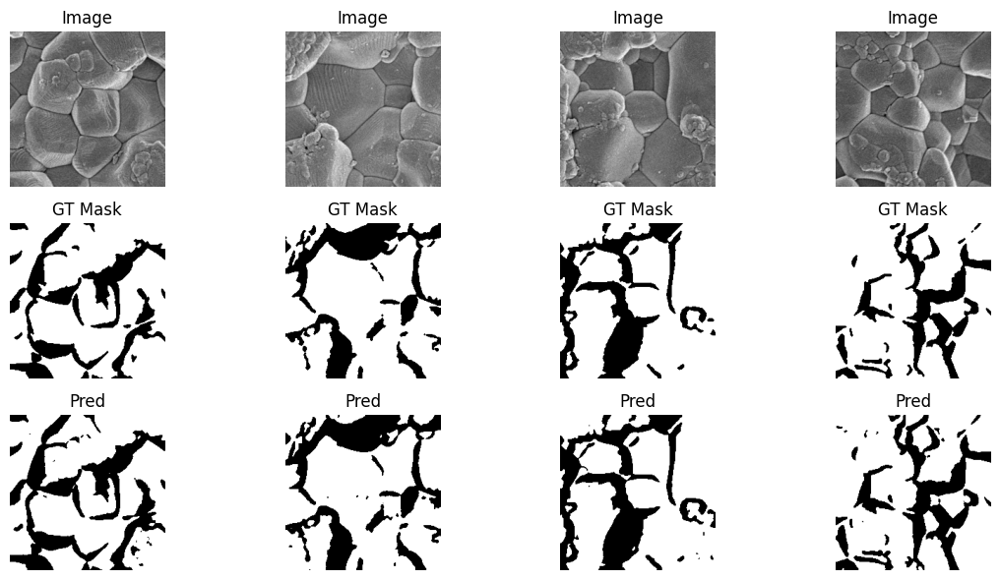

Epoch 15: U-Net Loss = 0.2342
Saved best U-Net model
Epoch 16: U-Net Loss = 0.2257
Saved best U-Net model


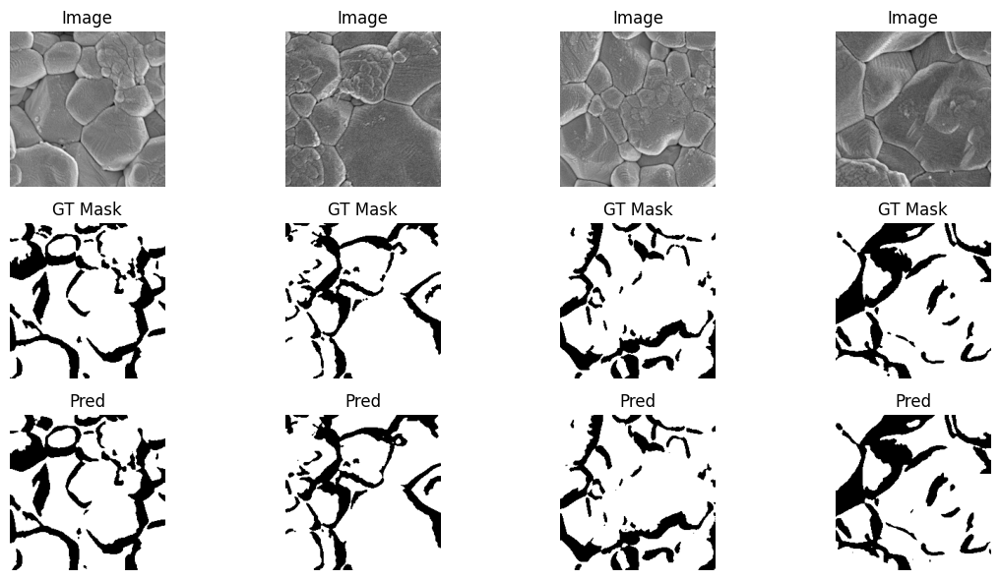

Epoch 17: U-Net Loss = 0.2186
Saved best U-Net model
Epoch 18: U-Net Loss = 0.2120
Saved best U-Net model


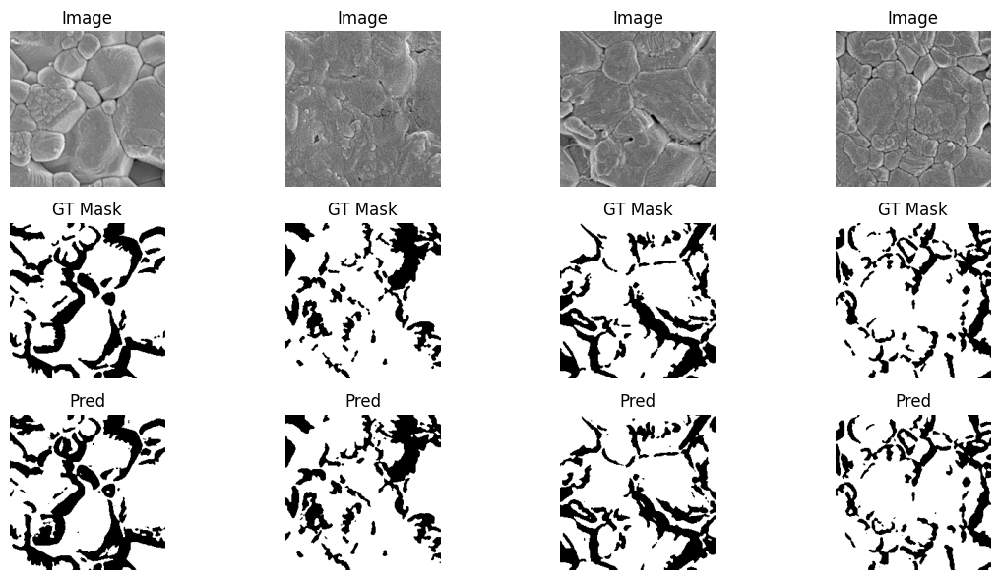

Epoch 19: U-Net Loss = 0.2034
Saved best U-Net model


In [29]:
train_losses_unet = []
best_loss = float("inf")

for epoch in range(20):
    unet_model.train()
    total_loss = 0

    for images, masks in seg_loader:
        images = images.to(device)
        masks = masks.to(device)

        preds = unet_model(images)
        loss = criterion(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(seg_loader)
    train_losses_unet.append(avg_loss)

    print(f"Epoch {epoch}: U-Net Loss = {avg_loss:.4f}")

    if avg_loss < best_loss:
        best_loss = avg_loss
        torch.save(unet_model.state_dict(), "best_unet_1400_1.pth")
        print("Saved best U-Net model")

    if epoch % 2 == 0:
        visualize_predictions(unet_model, seg_loader, device)

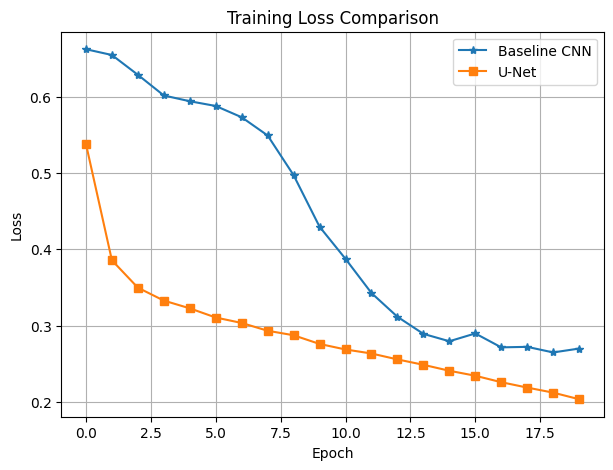

In [30]:
plt.figure(figsize=(7, 5))

plt.plot(train_losses, marker='*', label="Baseline CNN")
plt.plot(train_losses_unet, marker='s', label="U-Net")
#plt.scatter(best_epoch, min(train_losses), color='red', label='Best Epoch')
plt.title("Training Loss Comparison")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

In [31]:
#frozen dinov2
import torch
import torch.nn as nn
import torch.nn.functional as F

device = "cuda" if torch.cuda.is_available() else "cpu"

dino = torch.hub.load("facebookresearch/dinov2", "dinov2_vits14")
dino = dino.to(device)
dino.eval()

for p in dino.parameters():
    p.requires_grad = False

Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /tmp/torch/hub/main.zip
/tmp/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/tmp/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/tmp/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /tmp/torch/hub/checkpoints/dinov2_vits14_pretrain.pth
100%|███████████████████████████████████████| 84.2M/84.2M [00:00<00:00, 115MB/s]


In [32]:
class DINOv2SegNet(nn.Module):
    def __init__(self, dino_backbone, feature_dim=384, out_channels=1):
        super().__init__()

        self.dino = dino_backbone

        # Decoder: 16x16 → 224x224
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(feature_dim, 256, kernel_size=2, stride=2),  # 16 → 32
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2),          # 32 → 64
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2),           # 64 → 128
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Upsample(size=(224, 224), mode="bilinear", align_corners=False),

            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(32, out_channels, kernel_size=1)
        )

    def forward(self, x):
        # Get DINO patch features
        with torch.no_grad():
            features = self.dino.forward_features(x)

            # patch tokens: [B, 256, 384]
            patch_tokens = features["x_norm_patchtokens"]

        B, N, C = patch_tokens.shape

        # 256 patches = 16 x 16
        h = w = int(N ** 0.5)

        # [B, 256, 384] → [B, 384, 16, 16]
        feature_map = patch_tokens.permute(0, 2, 1).reshape(B, C, h, w)

        # Decode to segmentation mask
        out = self.decoder(feature_map)

        return out

In [33]:
dino_seg_model = DINOv2SegNet(dino).to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(dino_seg_model.decoder.parameters(), lr=1e-4)

In [34]:
dino_seg_model.decoder.parameters()

<generator object Module.parameters at 0x2b612c5e1c40>

Epoch 0: DINOv2-Seg Loss = 0.6522
Saved best DINOv2 segmentation model


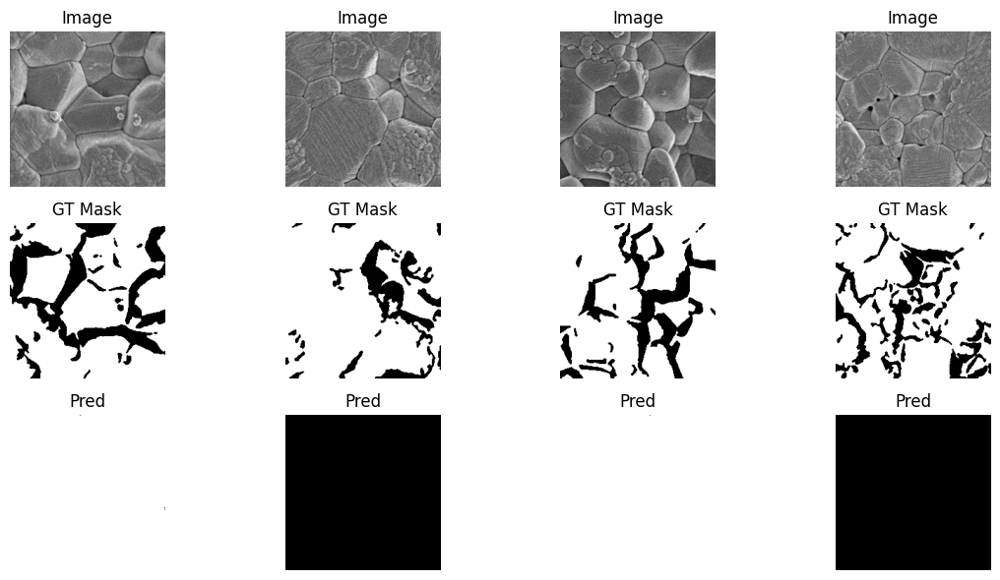

Epoch 1: DINOv2-Seg Loss = 0.5256
Saved best DINOv2 segmentation model
Epoch 2: DINOv2-Seg Loss = 0.4645
Saved best DINOv2 segmentation model


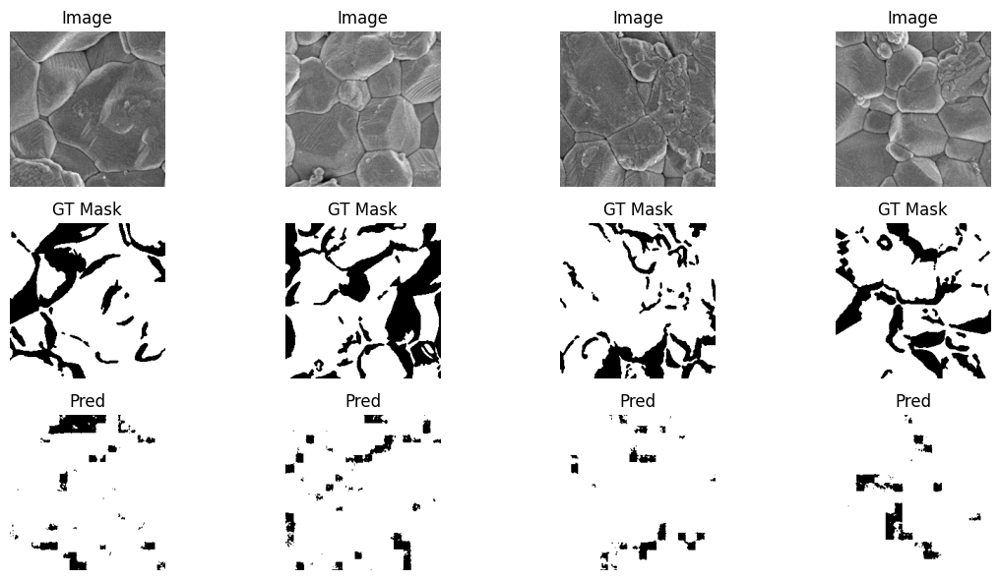

Epoch 3: DINOv2-Seg Loss = 0.4357
Saved best DINOv2 segmentation model
Epoch 4: DINOv2-Seg Loss = 0.4156
Saved best DINOv2 segmentation model


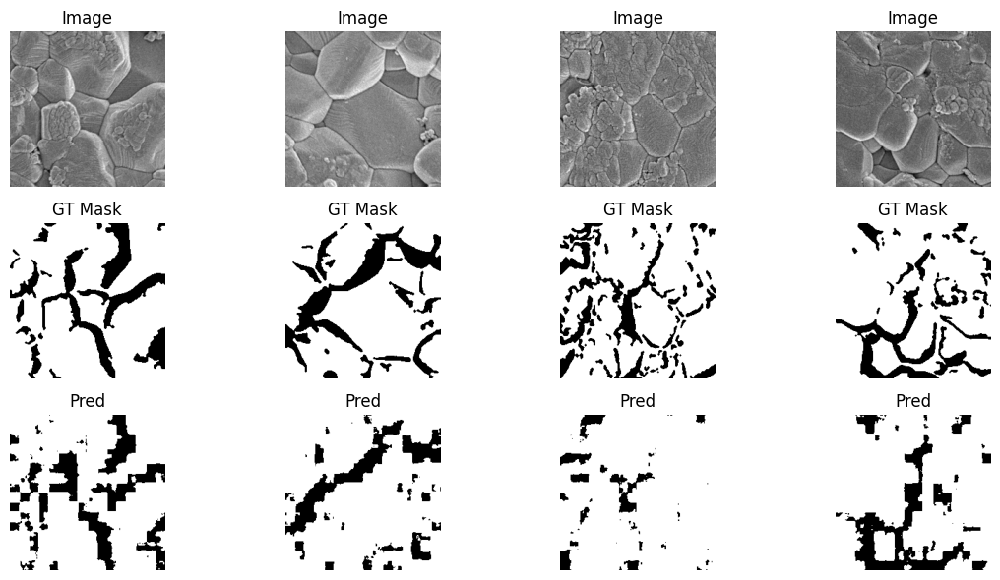

Epoch 5: DINOv2-Seg Loss = 0.3981
Saved best DINOv2 segmentation model
Epoch 6: DINOv2-Seg Loss = 0.3831
Saved best DINOv2 segmentation model


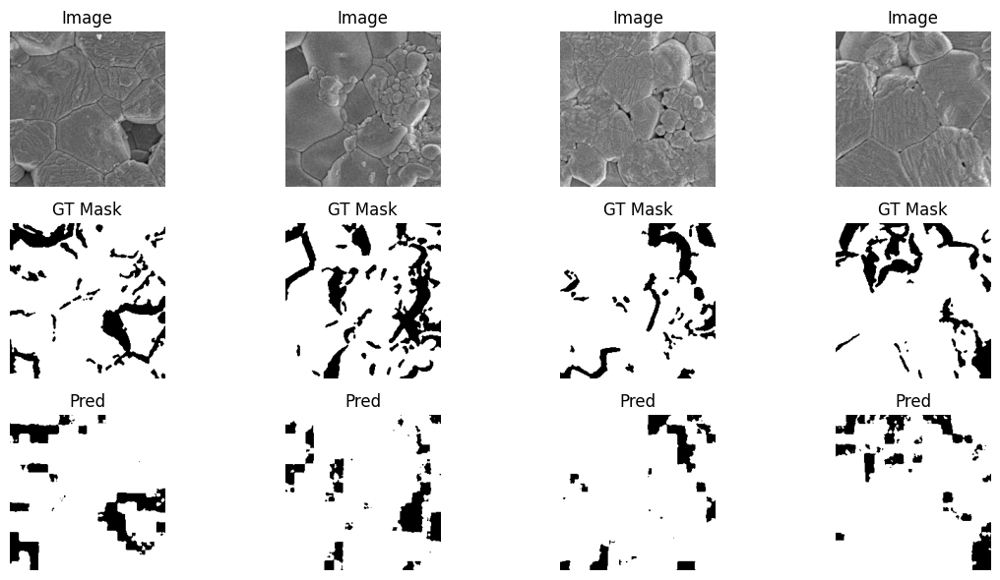

Epoch 7: DINOv2-Seg Loss = 0.3740
Saved best DINOv2 segmentation model
Epoch 8: DINOv2-Seg Loss = 0.3673
Saved best DINOv2 segmentation model


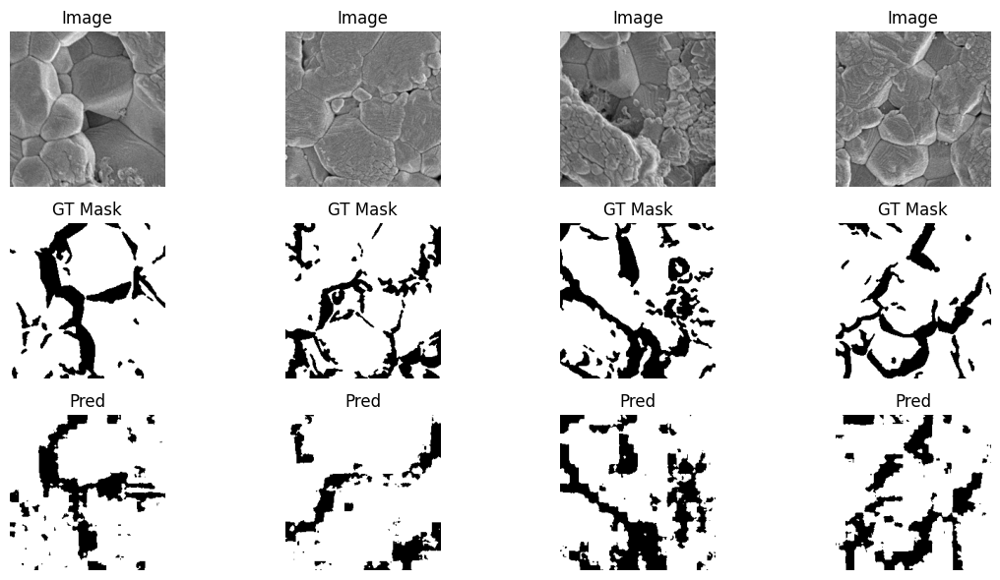

Epoch 9: DINOv2-Seg Loss = 0.3598
Saved best DINOv2 segmentation model
Epoch 10: DINOv2-Seg Loss = 0.3556
Saved best DINOv2 segmentation model


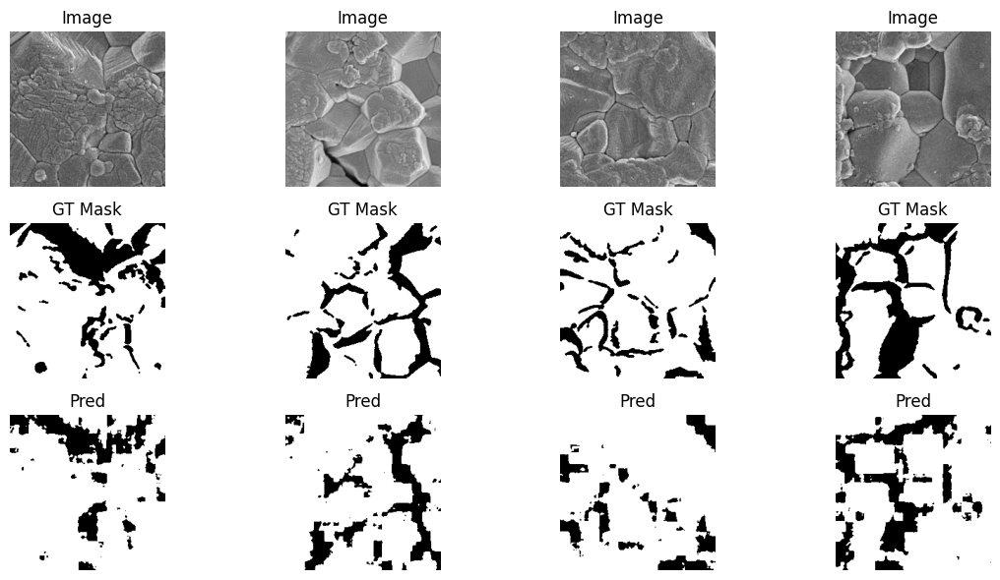

Epoch 11: DINOv2-Seg Loss = 0.3484
Saved best DINOv2 segmentation model
Epoch 12: DINOv2-Seg Loss = 0.3431
Saved best DINOv2 segmentation model


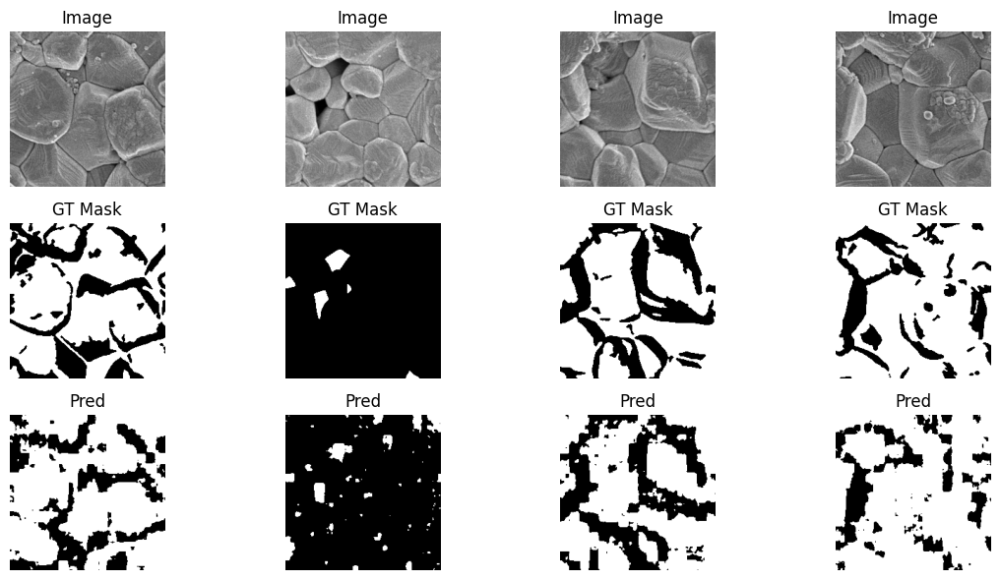

Epoch 13: DINOv2-Seg Loss = 0.3421
Saved best DINOv2 segmentation model
Epoch 14: DINOv2-Seg Loss = 0.3349
Saved best DINOv2 segmentation model


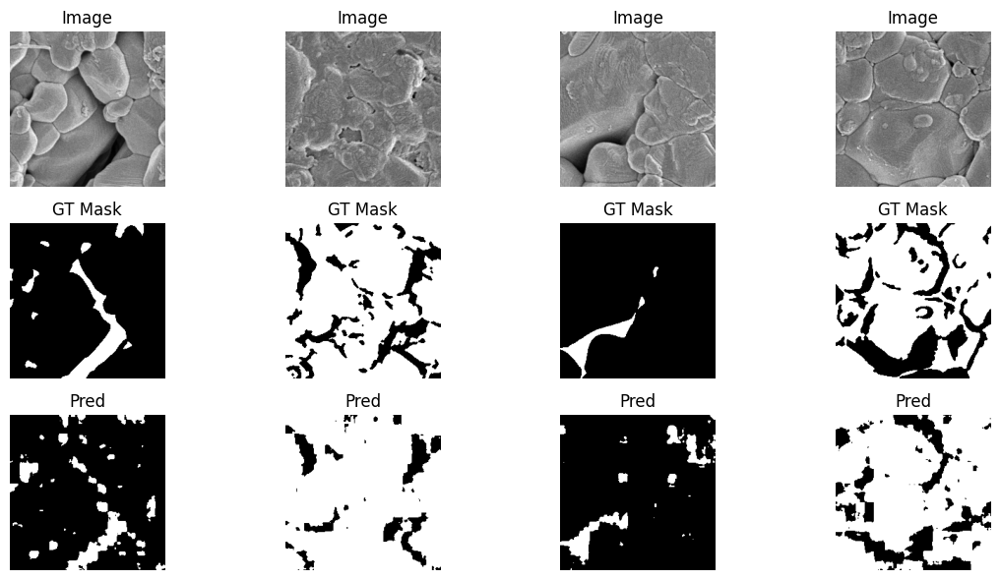

Epoch 15: DINOv2-Seg Loss = 0.3329
Saved best DINOv2 segmentation model
Epoch 16: DINOv2-Seg Loss = 0.3278
Saved best DINOv2 segmentation model


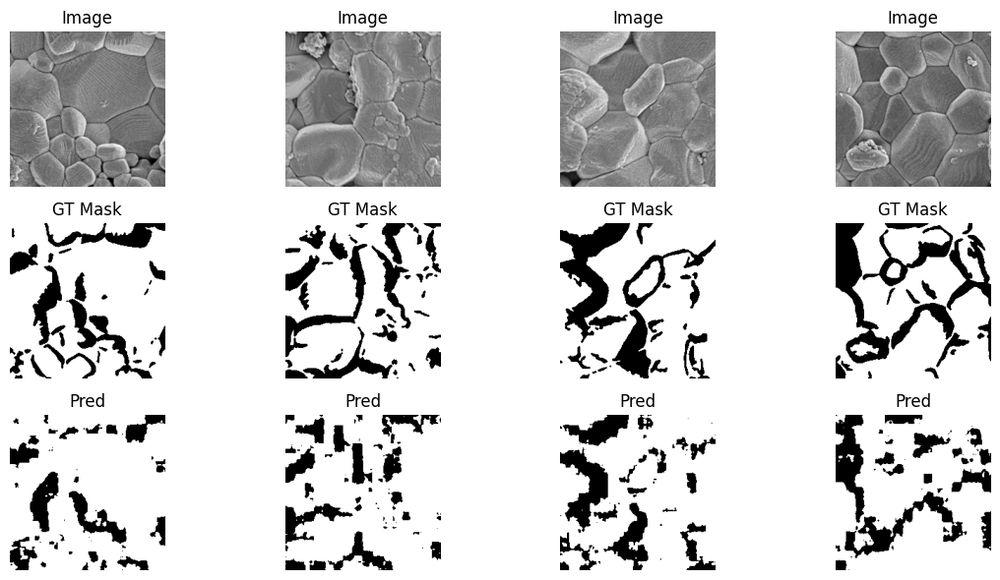

Epoch 17: DINOv2-Seg Loss = 0.3246
Saved best DINOv2 segmentation model
Epoch 18: DINOv2-Seg Loss = 0.3186
Saved best DINOv2 segmentation model


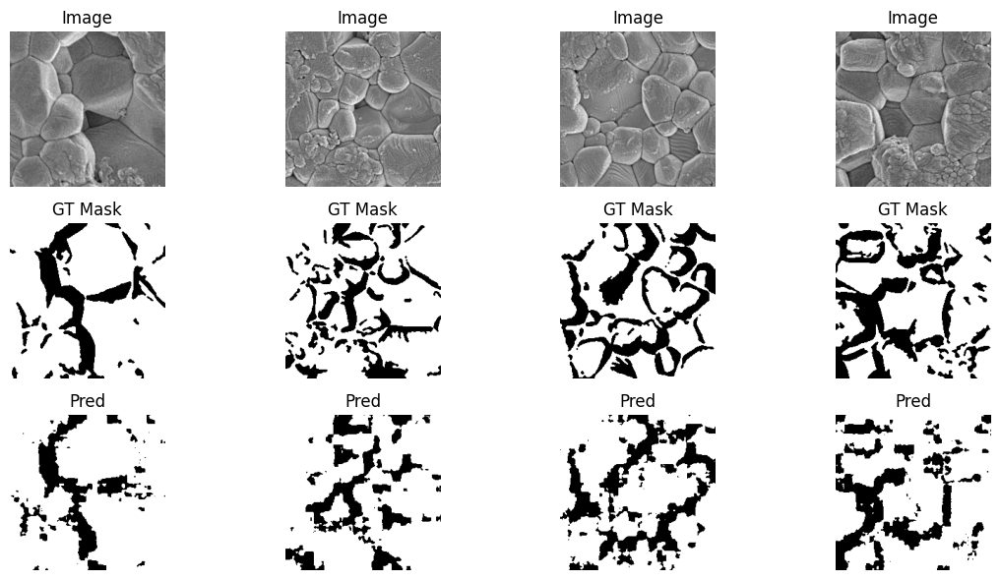

Epoch 19: DINOv2-Seg Loss = 0.3163
Saved best DINOv2 segmentation model


In [35]:
train_losses_dino = []
best_loss = float("inf")

for epoch in range(20):
    dino_seg_model.train()
    total_loss = 0

    for images, masks in seg_loader:
        images = images.to(device)
        masks = masks.to(device)

        preds = dino_seg_model(images)
        loss = criterion(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(seg_loader)
    train_losses_dino.append(avg_loss)

    print(f"Epoch {epoch}: DINOv2-Seg Loss = {avg_loss:.4f}")

    if avg_loss < best_loss:
        best_loss = avg_loss
        torch.save(dino_seg_model.state_dict(), "best_dinov2_segnet_1400_1.pth")
        print("Saved best DINOv2 segmentation model")

    if epoch % 2 == 0:
        visualize_predictions(dino_seg_model, seg_loader, device)

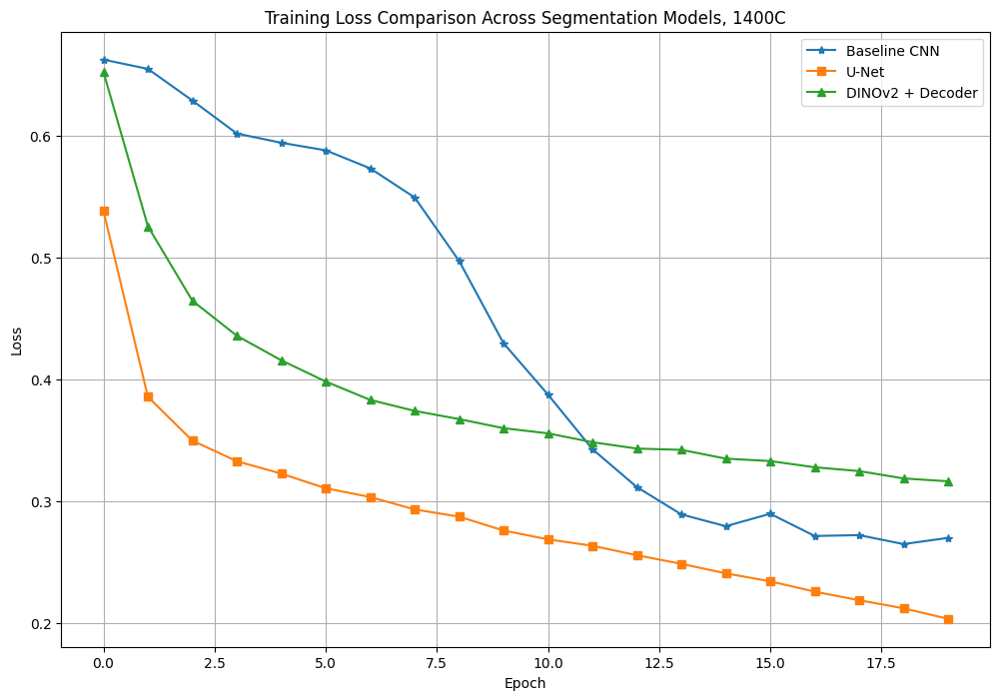

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

plt.plot(train_losses, marker="*", label="Baseline CNN")
plt.plot(train_losses_unet, marker="s", label="U-Net")
plt.plot(train_losses_dino, marker="^", label="DINOv2 + Decoder")

plt.title("Training Loss Comparison Across Segmentation Models, 1400C")
plt.xlabel("Epoch")
plt.ylabel("Loss")
#plt.xticks(epochs)
plt.legend()
plt.grid(True)

plt.show()

In [37]:
#evaluation metrics
def get_predictions(model, loader, device):
    model.eval()
    
    all_preds = []
    all_masks = []

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device)
            masks = masks.to(device)

            logits = model(images)
            probs = torch.sigmoid(logits)

            preds = (probs > 0.5).float()

            all_preds.append(preds.cpu())
            all_masks.append(masks.cpu())

    return torch.cat(all_preds), torch.cat(all_masks)

In [38]:
def dice_score(pred, target, eps=1e-6):
    intersection = (pred * target).sum()
    return (2. * intersection) / (pred.sum() + target.sum() + eps)


def iou_score(pred, target, eps=1e-6):
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    return intersection / (union + eps)


def pixel_accuracy(pred, target):
    correct = (pred == target).float().sum()
    total = torch.numel(pred)
    return correct / total

In [39]:
def evaluate_model(model, loader, device):
    preds, masks = get_predictions(model, loader, device)

    dice = dice_score(preds, masks).item()
    iou = iou_score(preds, masks).item()
    acc = pixel_accuracy(preds, masks).item()

    print(f"Dice Score: {dice:.4f}")
    print(f"IoU Score: {iou:.4f}")
    print(f"Pixel Accuracy: {acc:.4f}")

    return dice, iou, acc

In [40]:
print("=== CNN ===")
cnn_metrics = evaluate_model(model, seg_loader, device)

print("\n=== U-Net ===")
unet_metrics = evaluate_model(unet_model, seg_loader, device)

print("\n=== DINOv2 ===")
dino_metrics = evaluate_model(dino_seg_model, seg_loader, device)

=== CNN ===
Dice Score: 0.9295
IoU Score: 0.8683
Pixel Accuracy: 0.8957

=== U-Net ===
Dice Score: 0.9813
IoU Score: 0.9633
Pixel Accuracy: 0.9725

=== DINOv2 ===
Dice Score: 0.9068
IoU Score: 0.8295
Pixel Accuracy: 0.8603


In [43]:
print("Model      Dice      IoU       Accuracy")
print("----------------------------------------")
print(f"CNN        {cnn_metrics[0]:.4f}    {cnn_metrics[1]:.4f}    {cnn_metrics[2]:.4f}")
print(f"U-Net      {unet_metrics[0]:.4f}    {unet_metrics[1]:.4f}    {unet_metrics[2]:.4f}")
print(f"DINOv2     {dino_metrics[0]:.4f}    {dino_metrics[1]:.4f}    {dino_metrics[2]:.4f}")

Model      Dice      IoU       Accuracy
----------------------------------------
CNN        0.9295    0.8683    0.8957
U-Net      0.9813    0.9633    0.9725
DINOv2     0.9068    0.8295    0.8603


In [ ]:
dice_scores = []
iou_scores = []

for epoch in range(20):
    model.train()
    total_loss = 0

    epoch_dice = 0
    epoch_iou = 0

    for images, masks in seg_loader:
        images = images.to(device)
        masks = masks.to(device)

        preds = model(images)
        loss = criterion(preds, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        # metrics
        epoch_dice += dice_score(preds, masks)
        epoch_iou += iou_score(preds, masks)

    avg_loss = total_loss / len(seg_loader)
    avg_dice = epoch_dice / len(seg_loader)
    avg_iou = epoch_iou / len(seg_loader)

    print(f"Epoch {epoch}: Loss={avg_loss:.4f}, Dice={avg_dice:.4f}, IoU={avg_iou:.4f}")

    dice_scores.append(avg_dice)
    iou_scores.append(avg_iou)